# 3D Deblending on Volve dataset

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
import scipy as sp

import pylops
from scipy.sparse.linalg import eigsh as sp_eigsh
from pylops import LinearOperator

from pylops.waveeqprocessing import BlendingContinuous
from pylops.optimization.basic import lsqr
from pylops.signalprocessing import Patch3D

from utils import *
from visual import *

Loading a pre-processed CRG from the Volve dataset

In [2]:
f = np.load('../data/Volve3D_full_for_deblending.npz')
f


NpzFile '/home/sanchear/Documents/Volve-3Deblend/data/Volve3D_full_for_deblending.npz' with keys: dreg, dreg1, dreg2, dregfilt1, dregfilt2...

We can work with different versions of the data depending on the type of pre-processing we chose. After running different tests I decided to present the results from just one of the versions.

In [5]:
for key in iter(f.keys()):
    print(key)

dreg
dreg1
dreg2
dregfilt1
dregfilt2
t


In [9]:
data = f['dreg']
#data = f['dregfilt1']
data.shape

(40, 480, 2000)

Clipping the data helped us to run our tests faster:

In [10]:
#clip the time axis to 1200
data = data[:,100:400,:1200]

t = f['t']
dt = t[1]
t = t[:1200]

data.shape,t.shape

((40, 300, 1200), (1200,))

In [11]:
ns = data.shape[0]*data.shape[1]
nr = 1
nt = t.size

In [12]:
data_reshaped = data.reshape(ns, nt)
data_reshaped = np.expand_dims(data_reshaped, axis=1)
data_reshaped.shape


(12000, 1, 1200)

Plotting the clean CRG

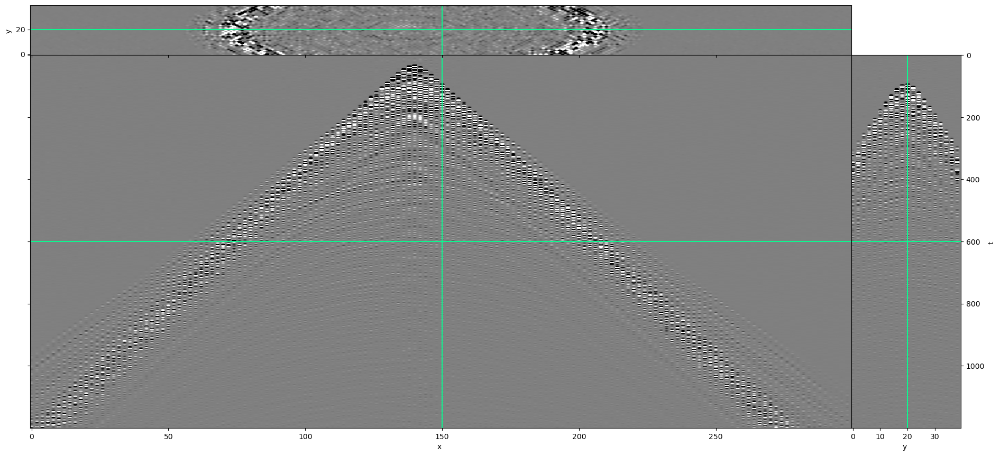

In [15]:
explode_volume(data.transpose(2, 1, 0), cmap='gray',figsize=(22, 10));


Creating the firing times before creating a blending operator

In [17]:
set_seed(42)

nsx, nsy = data.shape[0], data.shape[1]

firing = np.zeros((nsy, nsx))
firing[:nsy//2,:] = np.arange(nsx*nsy//2).reshape(nsy//2, nsx)
firing[nsy//2:,:] = np.arange(nsx*nsy//2).reshape(nsy//2, nsx)

# mimic boat going left right / right left
for i in range(1, nsy//2, 2):
    firing[i] = np.flipud(firing[i])
for i in range(nsy//2+1, nsy, 2):
    firing[i] = np.flipud(firing[i])

firingjit = firing + np.random.normal(0, .2, firing.shape)

firingjit[firingjit>firing.max()] = firing.max()
firingjit[firingjit<0] = 0



## Blending de CRG with the obtained firing times

In [20]:
Bop = BlendingContinuous(nt, 1, ns, dt, firingjit.ravel(), dtype = 'complex128')


In [21]:
# Blending data
dblend = Bop * data_reshaped.ravel()
dblend.shape

(3000701,)

## Applying the adjoint of the Blending Operator to Pseudodeblend the data

In [22]:
#Pseudo deblending
dpseudo = Bop.H * dblend
dpseudo_to_patch = dpseudo.reshape(data.shape[0], data.shape[1], nt)
dpseudo_to_patch.shape


(40, 300, 1200)

Plotting pseudodeblended data

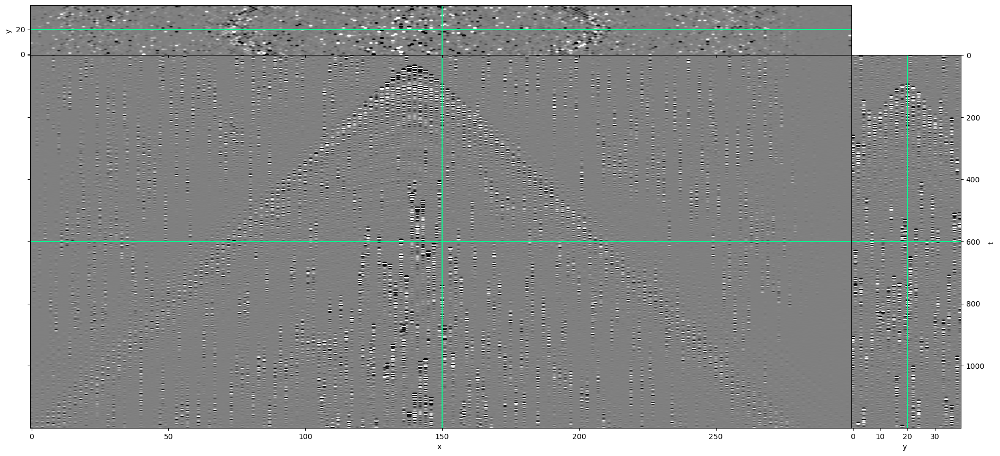

In [23]:
explode_volume(np.real(dpseudo_to_patch).transpose(2, 1, 0), cmap='gray',figsize=(22, 10));


Creating 3D Patching Operator

In [24]:
nwin = (15, 40, 200)  # window size in data domain
nover = (7, 20, 100)  # overlap between windows

FFT parameters:

In [25]:
dimsd = dpseudo_to_patch.shape
#nop = (
#    64,
#    64,
#    64 // 2 + 1,
#)  # window size in model domain; we use real FFT, third axis is half

nop = (
    128,
    128,
    128 // 2 + 1,
)  # window size in model domain; we use real FFT, third axis is half

#nop = (
#    256,
#    256,
#    256 // 2 + 1,
#)  # window size in model domain; we use real FFT, third axis is half



FFT Operator:

In [26]:
#Fop = pylops.signalprocessing.FFTND(nwin, nffts=(64, 64, 64), real=True)
#Fop = pylops.signalprocessing.FFTND(nwin, nffts=(256, 256, 256), real=True)
Fop = pylops.signalprocessing.FFTND(nwin, nffts=(128, 128, 128), real=True)

In [27]:
#nwins, dims, mwin_inends, dwin_inends = pylops.signalprocessing.patch3d_design(
#    dimsd, nwin, nover, (64, 64, 33)
#)
nwins, dims, mwin_inends, dwin_inends = pylops.signalprocessing.patch3d_design(
    dimsd, nwin, nover, (128, 128, 128//2 + 1)
)

#nwins, dims, mwin_inends, dwin_inends = pylops.signalprocessing.patch3d_design(
#    dimsd, nwin, nover, (256, 256, 256//2 + 1)
#)

In [28]:
Sop1 = pylops.signalprocessing.Patch3D(
    Fop.H, dims, dimsd, nwin, nover, nop, tapertype='none'
)

Sop = pylops.signalprocessing.Patch3D(
    Fop.H, dims, dimsd, nwin, nover, nop, tapertype='hanning'
)

### Reconstructing test

We use this test to check how our chosen parameters affect the reconstruction of the data

Apply FFT on 3D patches from pseudodeblended data

In [29]:
fft_patched = Sop1.H * dpseudo_to_patch.ravel()
fft_patched.shape

(656015360,)

In [30]:
fft_patched = fft_patched.reshape(dims)
fft_patched.shape

(512, 1792, 715)

In [31]:
fft_patched = fft_patched.reshape(nwins[0], nwins[1], nwins[2],nop[0], nop[1],nop[2])
fft_patched.shape

(4, 14, 11, 128, 128, 65)

Putting the patches back together and returning the data to the time domain

In [32]:
recovered_data = Sop*fft_patched
recovered_data.shape

(40, 300, 1200)

Difference

In [35]:
np.linalg.norm(recovered_data - dpseudo_to_patch) / np.linalg.norm(recovered_data)

0.6029922427597181

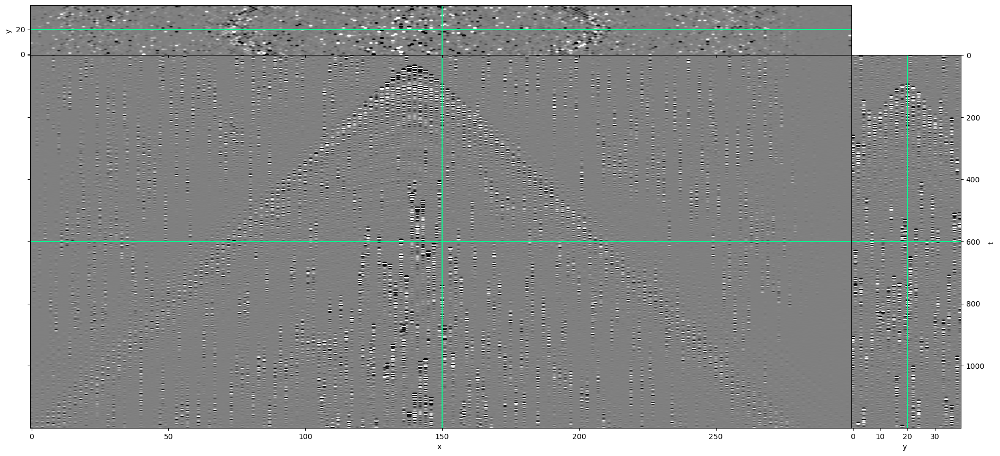

In [36]:
explode_volume(np.real(dpseudo_to_patch).transpose(2, 1, 0), cmap='gray',figsize=(22, 10));


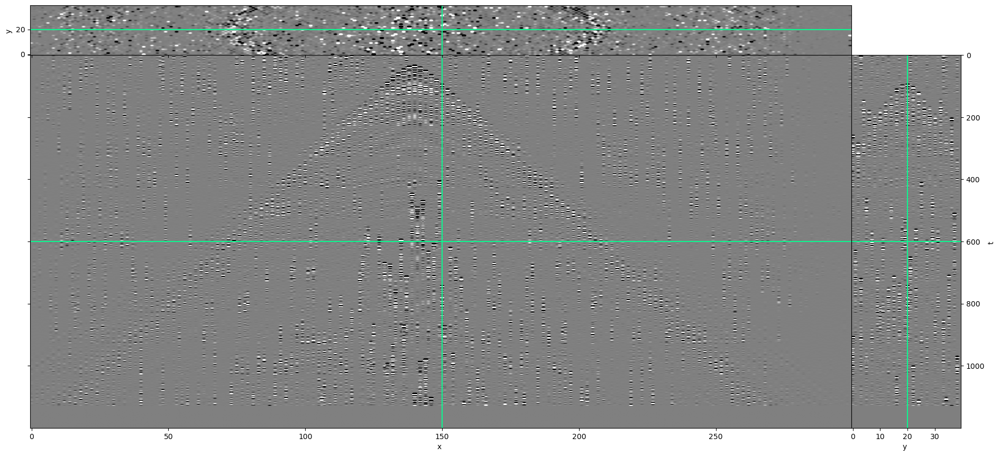

In [37]:
explode_volume(np.real(recovered_data).transpose(2, 1, 0), cmap='gray',figsize=(22, 10));


## FK-Spectra

We wil obtain the FK spectrum from a patch of clean and from pseudodeblended data

Patching with the Identity operator:

In [38]:
nwins_I, dims_I, mwin_inends_I, dwin_inends_i = pylops.signalprocessing.patch3d_design(
    dimsd, nwin, nover, nwin
)

I_Op = pylops.Identity(nwin)

I_Op = pylops.Identity(nwin)
Patch_Op_I = pylops.signalprocessing.Patch3D(
    I_Op, dims_I, dimsd, nwin, nover, nop=nwin, tapertype='none'
)



In [40]:
dclean_to_patch = data.copy()

In [42]:
dclean_patched = Patch_Op_I.H * dclean_to_patch
dclean_patched.shape

(4, 14, 11, 15, 40, 200)

In [43]:
dpseudo_patched = Patch_Op_I.H * dpseudo_to_patch
dpseudo_patched.shape

(4, 14, 11, 15, 40, 200)

Chosing a patch to plot:

In [48]:
chosen_patch = [1,6,3]

Patch of clean data

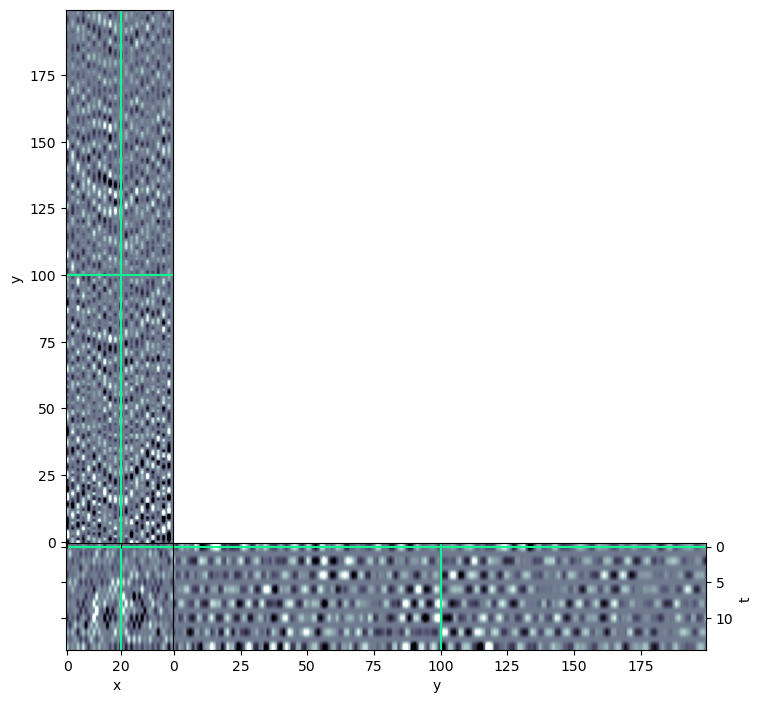

In [49]:
explode_volume(dclean_patched[chosen_patch[0],chosen_patch[1],chosen_patch[2],:,:,:], t=0);

Patch of pseudodeblended data

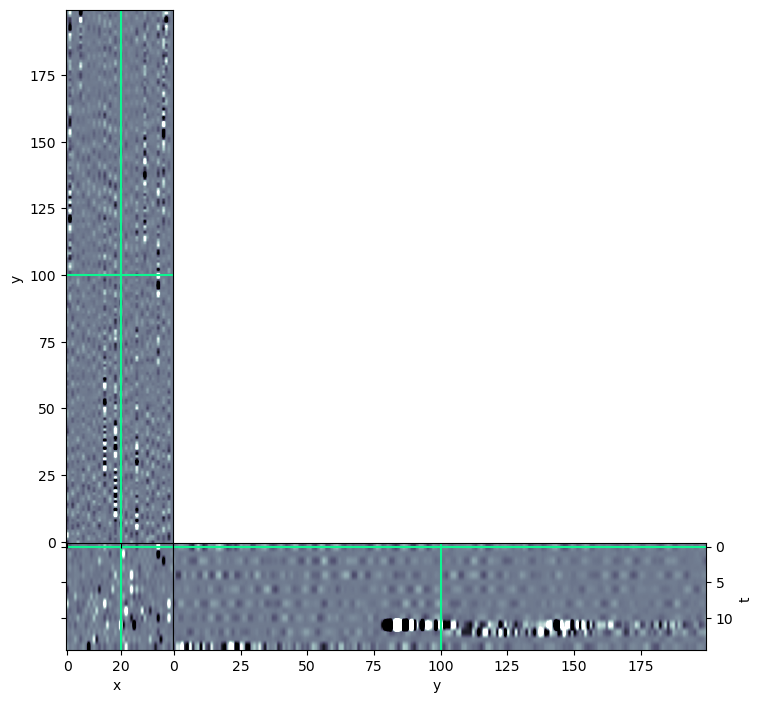

In [50]:
explode_volume(dpseudo_patched[chosen_patch[0],chosen_patch[1],chosen_patch[2],:,:,:], t=0);

Obtaining the spectrum for clean data patch

In [51]:
p_clean = Sop1.H * dclean_to_patch
p_clean.shape

(4, 14, 11, 128, 128, 65)

Extracting a specific patch from the clean data

In [53]:
patch_cleanfft = p_clean[chosen_patch[0],chosen_patch[1],chosen_patch[2],:,:,:]
patch_cleanfft.shape

(128, 128, 65)

In [54]:
#FK Spectrum
fk_clean_3D = np.fft.fftshift(np.abs(patch_cleanfft))

fk_clean_3D.shape

(128, 128, 65)

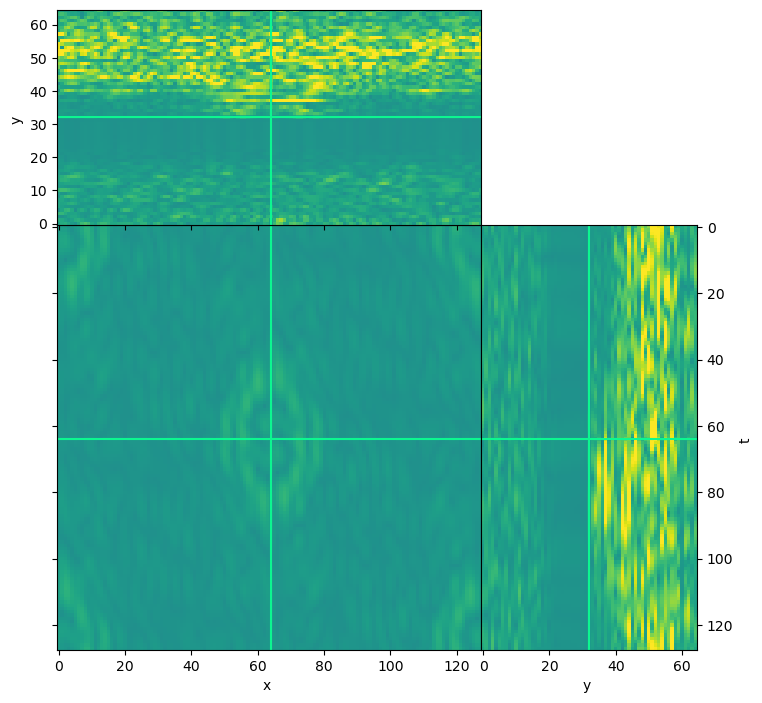

In [55]:
explode_volume(fk_clean_3D,cmap='viridis');

Obtaining the spectrum for the pseudodeblended patch

In [57]:
p_pseudo = Sop1.H * dpseudo_to_patch
p_pseudo.shape

(4, 14, 11, 128, 128, 65)

Extracting a specific patch from the pseudodeblended data

In [58]:
patch_pseudofft = p_pseudo[chosen_patch[0],chosen_patch[1],chosen_patch[2],:,:,:]
patch_pseudofft.shape

(128, 128, 65)

FK Spectrum of the whole 3D patch

In [59]:
fk_pseudo_3D = np.fft.fftshift(np.abs(patch_pseudofft))
fk_pseudo_3D.shape

(128, 128, 65)

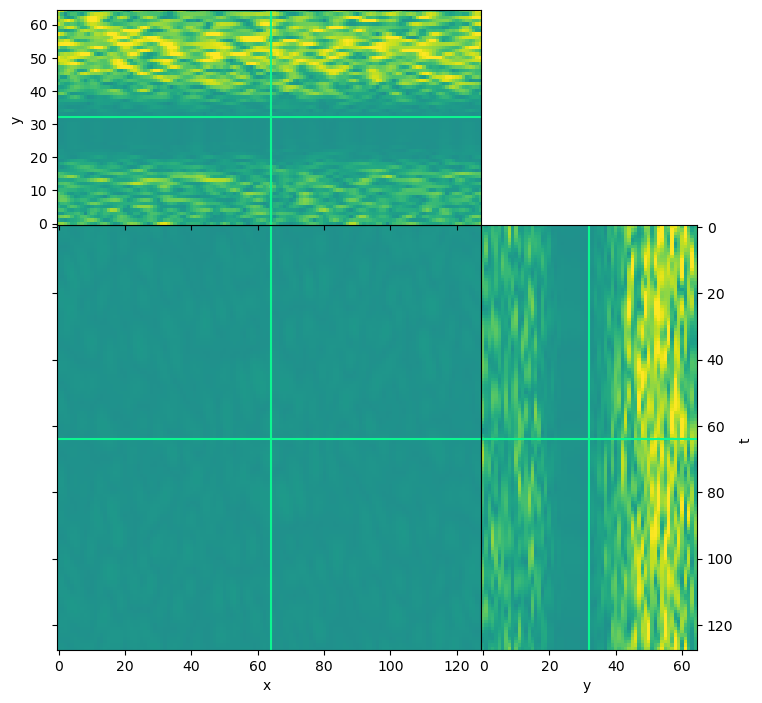

In [60]:
explode_volume(fk_pseudo_3D,cmap='viridis');

## Inversion

In [61]:
Op = Bop * Sop

Only run this cell if you have not computed this value before

In [44]:
Op1 = Op.H * Op
maxeig = np.abs(Op1.eigs(1, niter=5, ncv=5, tol=5e-2))[0]
alpha = 1.0 / maxeig

In [62]:
alpha = 1.7227

In [46]:
# Deblend
niter = 80
decay = (np.exp(-0.05 * np.arange(niter)) + 0.2) / 1.2

p_inv = pylops.optimization.sparsity.fista(
    Op,
    dblend.ravel(),
    niter=niter,
    #eps=1e-5,
    eps=1e6,
    #eps=1e2,
    alpha=alpha,
    decay=decay,
    show=True,
)[0]

FISTA (soft thresholding)
--------------------------------------------------------------------------------
The Operator Op has 1500701 rows and 83263488 cols
eps = 1.000000e+06	tol = 1.000000e-10	niter = 80
alpha = 2.861033e-01	thresh = 1.430516e+05
--------------------------------------------------------------------------------
   Itn          x[0]              r2norm     r12norm     xupdate
     1   0.00e+00+0.00e+00j    6.535e+17   7.082e+17   1.615e+08
     2   0.00e+00+0.00e+00j    5.956e+17   6.870e+17   1.150e+08
     3   0.00e+00+0.00e+00j    5.501e+17   6.756e+17   1.124e+08
     4   0.00e+00+0.00e+00j    5.166e+17   6.721e+17   1.037e+08
     5   0.00e+00+0.00e+00j    4.929e+17   6.740e+17   9.208e+07
     6   0.00e+00+0.00e+00j    4.763e+17   6.790e+17   7.933e+07
     7   0.00e+00+0.00e+00j    4.646e+17   6.857e+17   6.686e+07
     8   0.00e+00+0.00e+00j    4.560e+17   6.929e+17   5.593e+07
     9   0.00e+00+0.00e+00j    4.490e+17   7.001e+17   4.766e+07
    10   0.00e+00+0

In [52]:
data_inv = Sop * p_inv
data_inv.shape

(7200000,)

In [55]:
data_inv = data_inv.reshape(data.shape[0],data.shape[1],nt)

Run the cell below to save results:

In [51]:
np.save('VOLVE_results_partials_FILT.npy', data_inv)

Run the cell below to load results:

In [80]:
data_inv = np.load('VOLVE_results_partials_fk.npy')
data_inv.shape

(40, 300, 1200)

Deblended data:

(<Figure size 800x800 with 3 Axes>,
 (<Axes: xlabel='x '>, <Axes: xlabel='y ', ylabel='t '>, <Axes: ylabel='y '>))

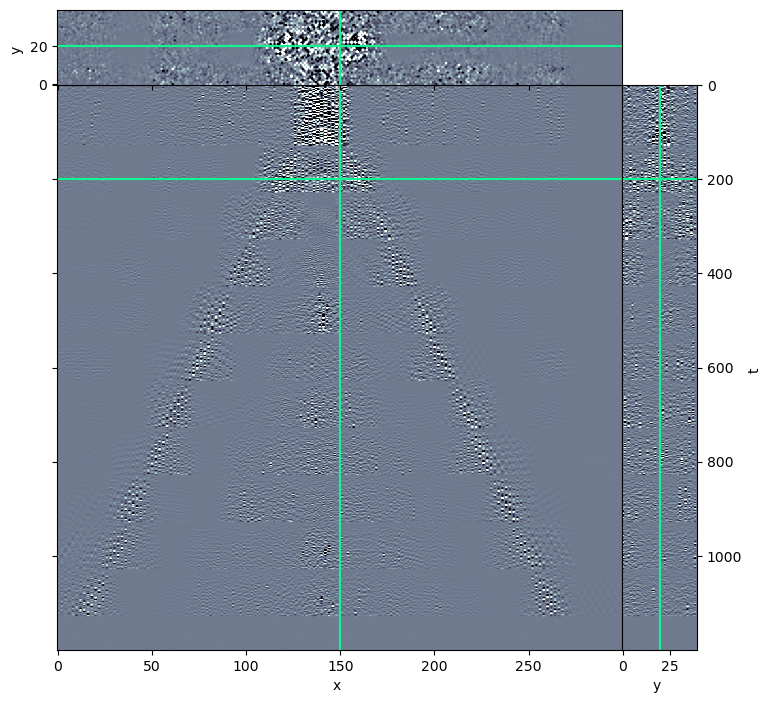

In [81]:
explode_volume(np.real(data_inv).transpose(2, 1, 0), t=200)

Norm:

In [82]:
np.linalg.norm(np.real(data_inv) - data) / np.linalg.norm(data)

0.6574700570236865

Difference

(<Figure size 800x800 with 3 Axes>,
 (<Axes: xlabel='x '>, <Axes: xlabel='y ', ylabel='t '>, <Axes: ylabel='y '>))

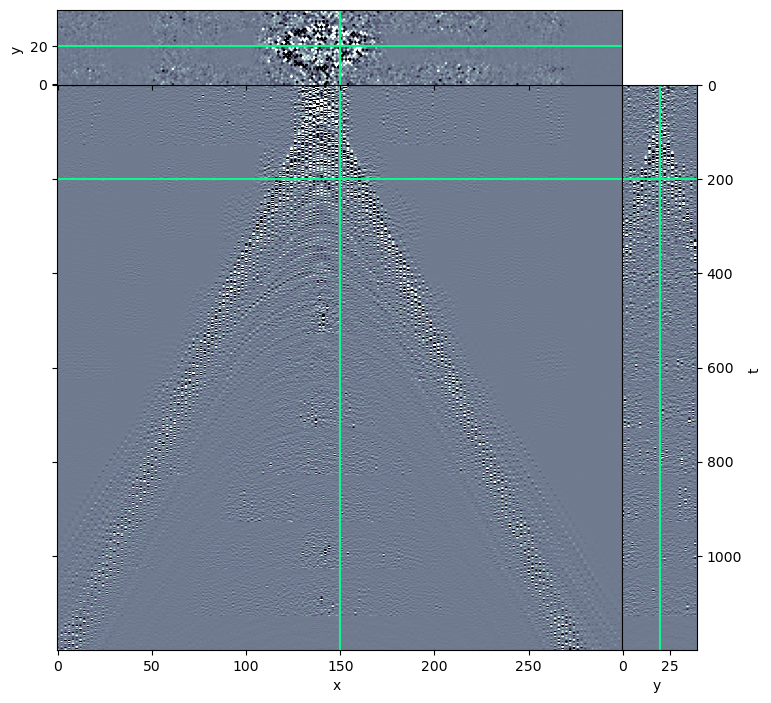

In [83]:
diff = np.real(data_inv) - data
explode_volume(diff.transpose(2, 1, 0), t=200)

### Values for plotting in the same scale

In [84]:
vmin = min(np.min(dclean_to_patch), np.min(np.real(data_inv)), np.min(diff),np.min(np.real(dpseudo_to_patch)))
vmax = max(np.max(dclean_to_patch), np.max(np.real(data_inv)), np.max(diff), np.max(np.real(dpseudo_to_patch)))

In [85]:
def replicate_line(ax, line):
    # Extract the y data as a scalar if it's an array
    y_data = line.get_ydata(orig=False)
    if hasattr(y_data, "__iter__"):  # Check if y_data is iterable (like a list or array)
        y_value = y_data[0]  # Take the first value if it's an iterable
    else:
        y_value = y_data  # Use the value directly if it's a scalar

    # Now create a new line with the extracted y_value
    new_line = ax.axhline(y=y_value, color=line.get_color(), linestyle=line.get_linestyle(), linewidth=line.get_linewidth())

    return new_line


def replicate_image(ax, img):
    # Create a new image with the same data and extent
    kwargs = {
        'extent': img.get_extent(),
        'cmap': img.get_cmap(),
        'aspect': 'auto',
        'interpolation': img.get_interpolation(),
        'origin': img.origin
    }
    
    # If the original image had clim values set, use them to set vmin and vmax
    if img.get_clim() is not None:
        kwargs['vmin'] = img.get_clim()[0]
        kwargs['vmax'] = img.get_clim()[1]

    # Check if the 'norm' attribute exists and handle accordingly
    # If 'norm' is not None and vmin/vmax are not in kwargs, then use 'norm'
    if hasattr(img, 'norm') and img.norm is not None and 'vmin' not in kwargs and 'vmax' not in kwargs:
        kwargs['norm'] = img.norm
    
    new_img = ax.imshow(img.get_array(), **kwargs)
    return new_img

In [86]:
def plot_volumes(axes,n_volumes,subtitles):
    # Create a new figure to display the three outputs side by side
    combined_fig, combined_axes = plt.subplots(n_volumes, 3, figsize=(15, 20))  # Adjust figsize as needed

    # Now replicate the contents of each axis returned by explode_volume into the new figure
    for i, original_axes in enumerate(axes):
        for j, ax in enumerate(original_axes):
            # Copy over the images, lines, etc.
            for line in ax.lines:
                replicate_line(combined_axes[i, j], line)
            for img in ax.images:
                replicate_image(combined_axes[i, j], img)
            # Set the axis labels, limits, etc.
            combined_axes[i, j].set_xlabel(ax.get_xlabel())
            combined_axes[i, j].set_ylabel(ax.get_ylabel())
            combined_axes[i, j].set_xlim(ax.get_xlim())
            combined_axes[i, j].set_ylim(ax.get_ylim())
            combined_axes[i, j].set_title(ax.get_title())

    # Define subtitles for each row
    row_titles = subtitles

    # Set subtitles for each row
    for i, row_title in enumerate(row_titles):
        # Use the first subplot of each row to place the subtitle
        combined_axes[i, 0].set_title(row_title, fontsize=16, weight='bold', loc='left', pad=20)

    # Hide unused axes if any
    for i in range(n_volumes):
        for j in range(3):
            if i >= len(combined_axes) or j >= len(combined_axes[i]):
                combined_axes[i, j].set_visible(False)

    # Adjust the layout
    combined_fig.tight_layout()

### Comparison

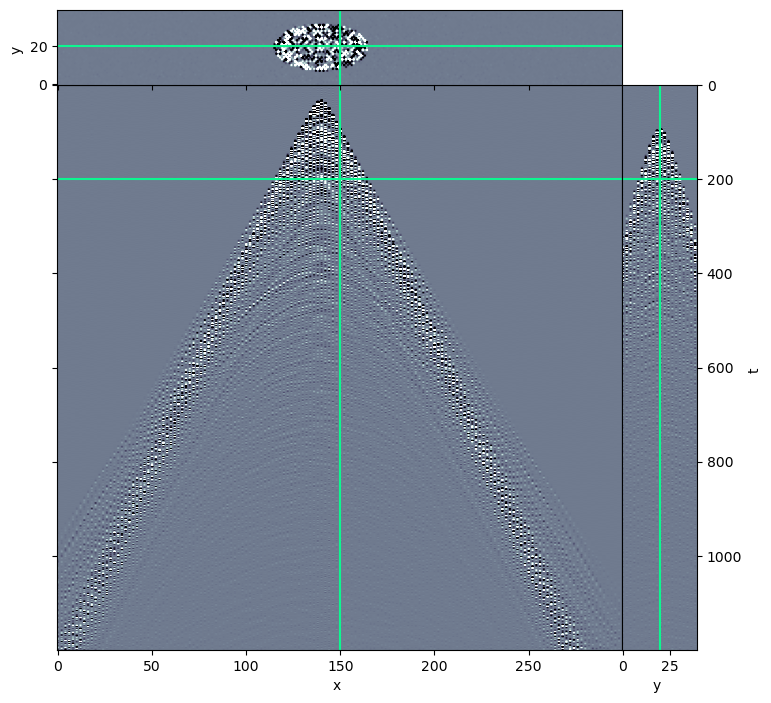

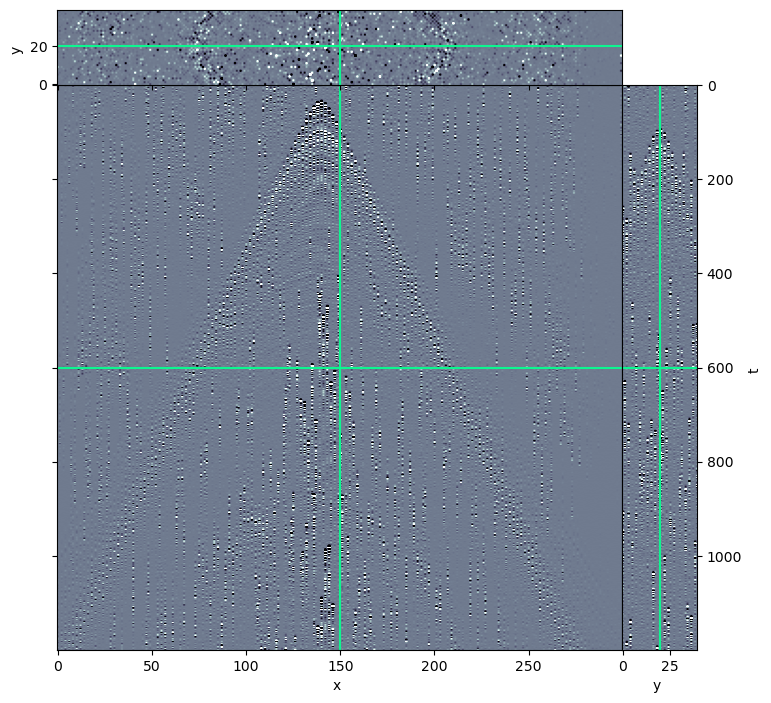

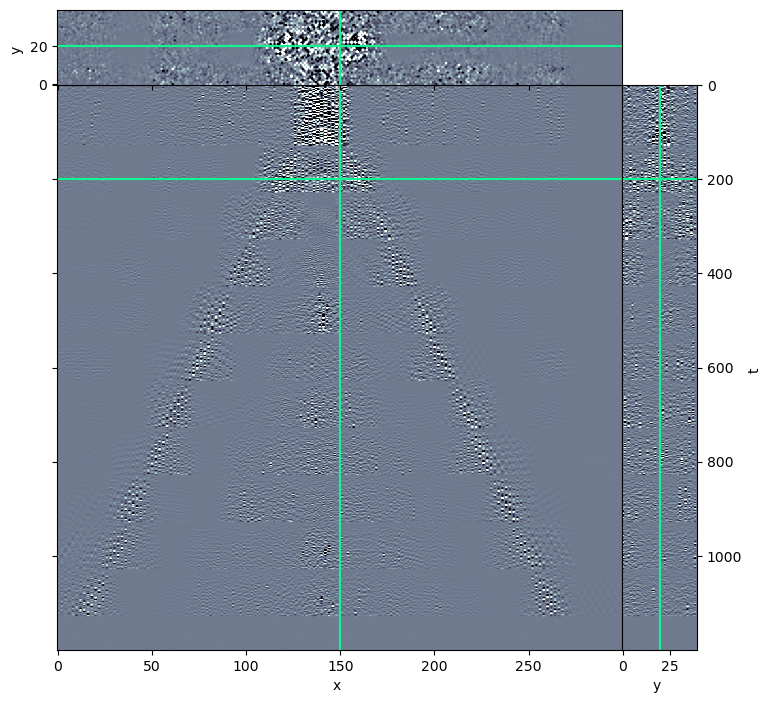

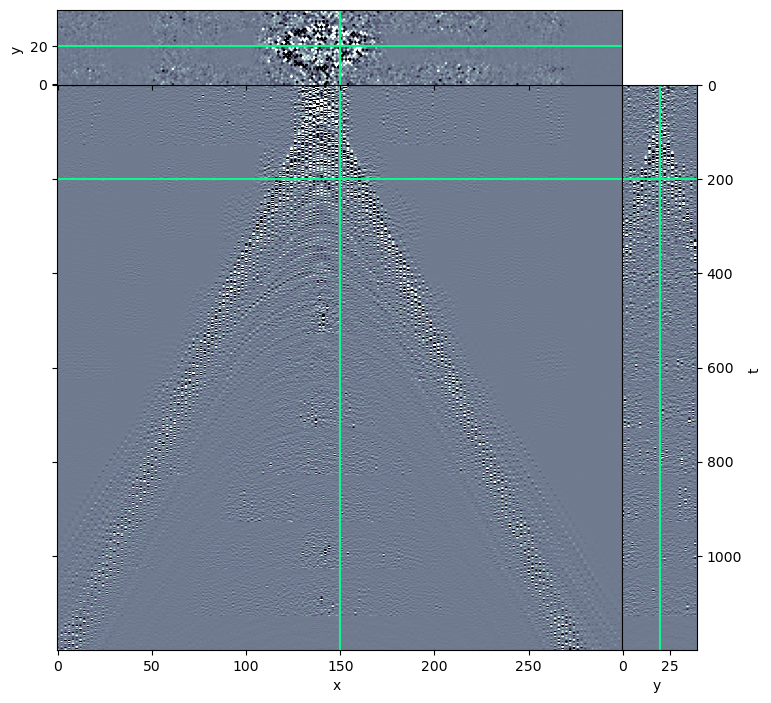

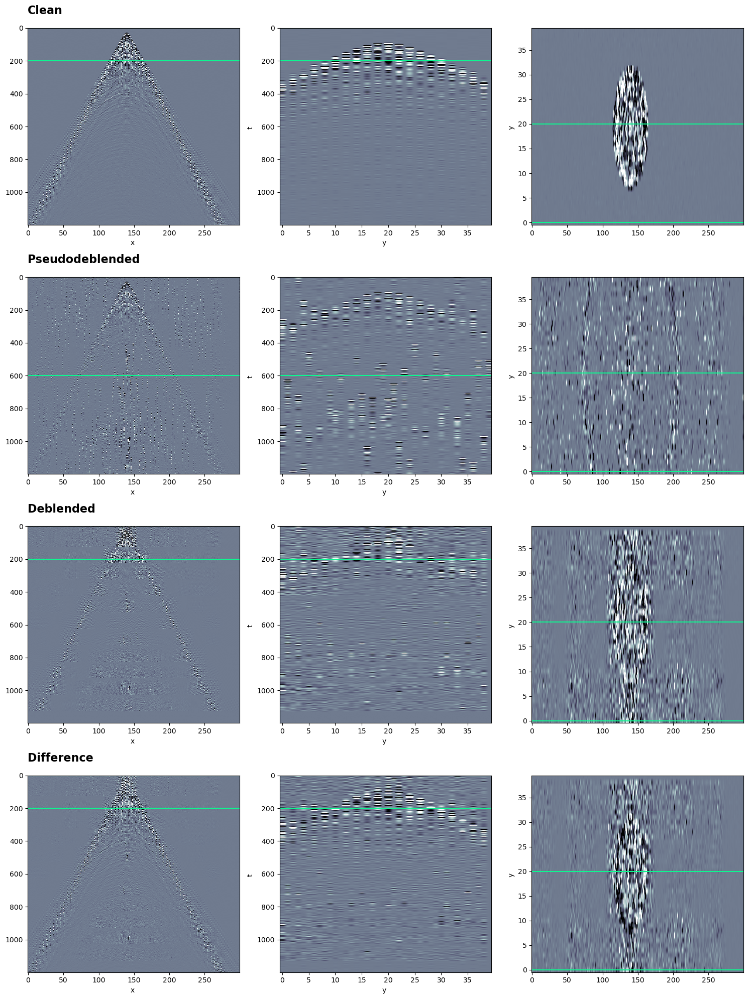

In [87]:
_, clean = explode_volume(dclean_to_patch.transpose(2, 1, 0), t=200)  # Set your parameters
_, pseudo = explode_volume(np.real(dpseudo_to_patch).transpose(2, 1, 0)) # Set different parameters
_, deblended = explode_volume(np.real(data_inv).transpose(2, 1, 0), t=200)  # Set different parameters
_, difference = explode_volume(np.real(diff).transpose(2, 1, 0), t=200)  # Set different parameters

plot_volumes([clean,pseudo,deblended,difference],4,['Clean','Pseudodeblended','Deblended','Difference'])

### Patching deblended data for plotting

In [88]:
ddeblend_patched = Patch_Op_I.H * data_inv
ddeblend_patched.shape

(4, 14, 11, 15, 40, 200)

In [89]:
patch_deblend = ddeblend_patched[chosen_patch[0],chosen_patch[1],chosen_patch[2],:,:,:]
patch_deblend.shape

(15, 40, 200)

In [90]:
fk_deblend_3D = np.fft.fftshift(np.abs(patch_deblend))
fk_deblend_3D.shape

(15, 40, 200)

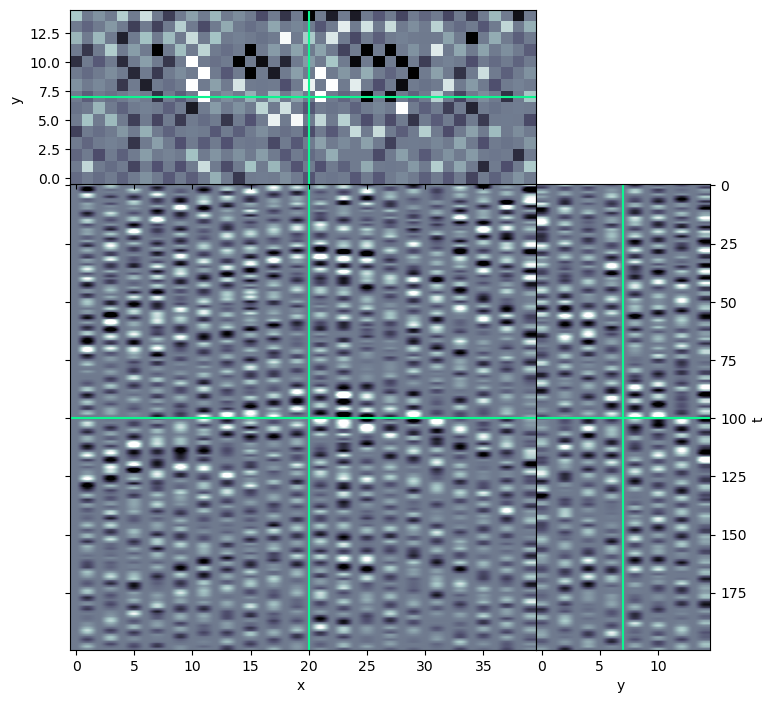

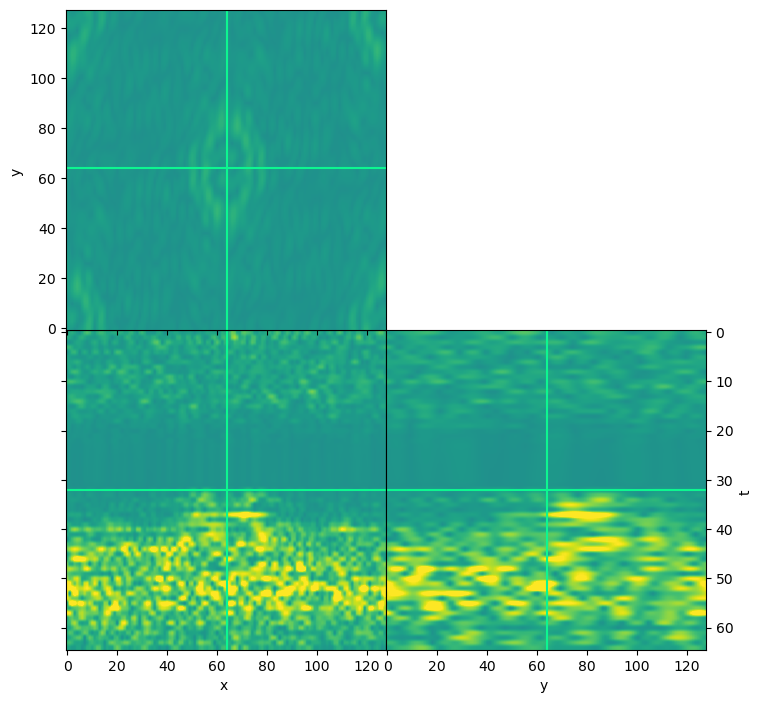

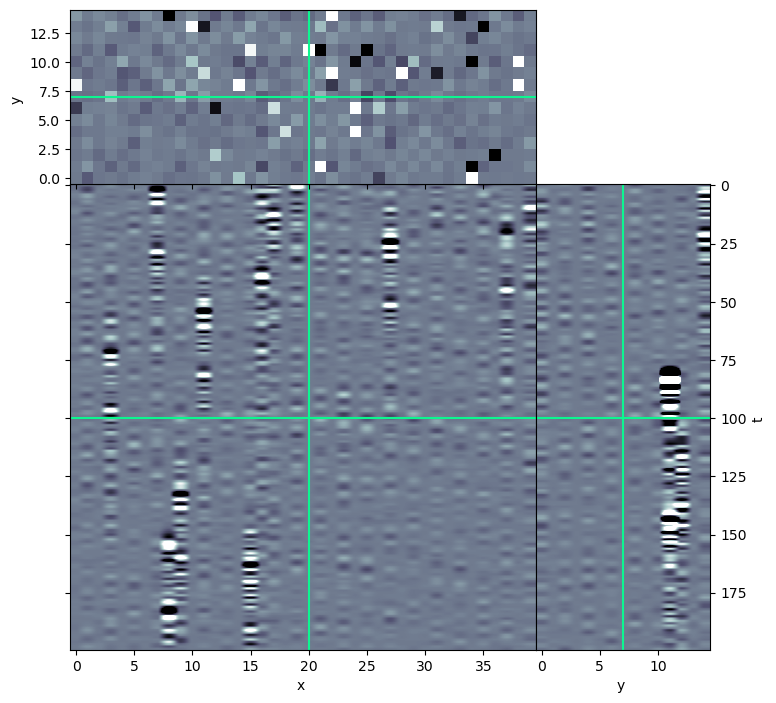

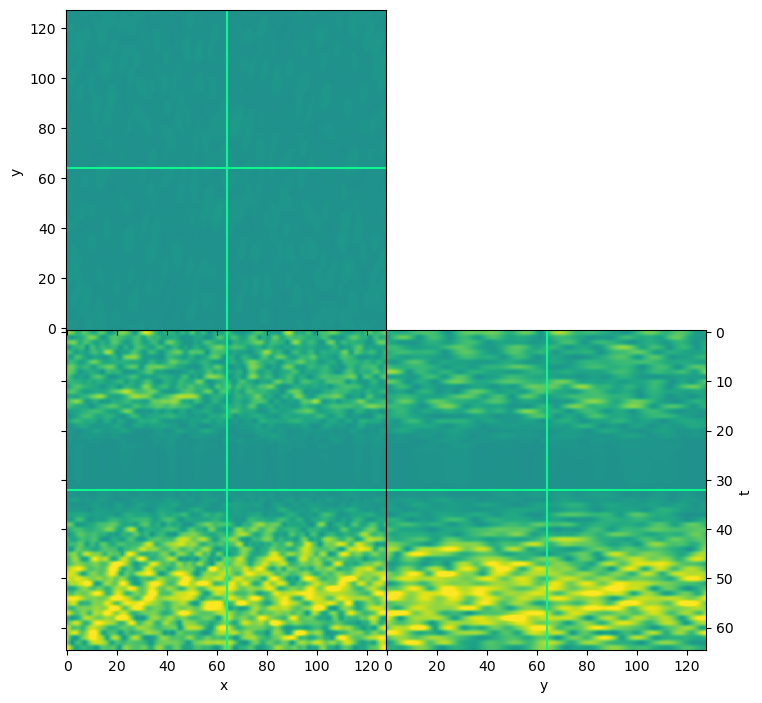

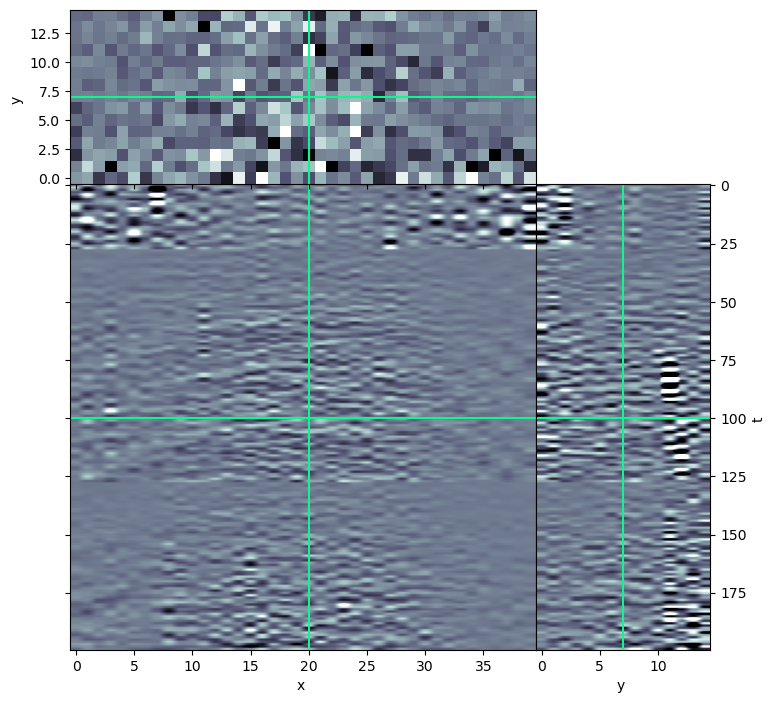

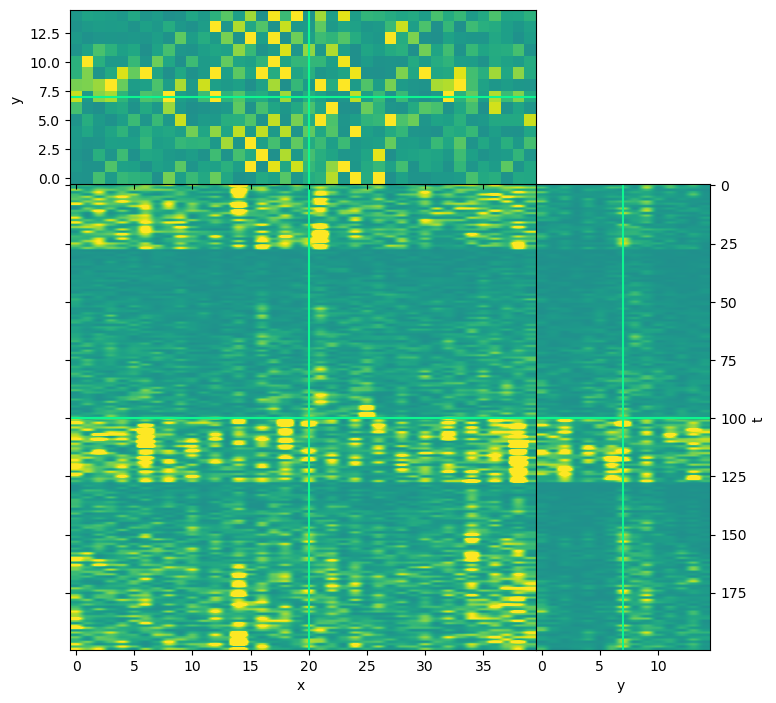

In [91]:
_, clean_patch = explode_volume(dclean_patched[chosen_patch[0],chosen_patch[1],chosen_patch[2],:,:,:].transpose(2, 1, 0))  # Set your parameters
_, clean_fk = explode_volume(fk_clean_3D.transpose(2, 1, 0),cmap='viridis')  # Set your parameters
_, pseudo_patch = explode_volume(dpseudo_patched[chosen_patch[0],chosen_patch[1],chosen_patch[2],:,:,:].transpose(2, 1, 0)) # Set different parameters
_, pseudo_fk = explode_volume(fk_pseudo_3D.transpose(2, 1, 0),cmap='viridis')  # Set your parameters
_, deblended_patch = explode_volume(np.real(patch_deblend).transpose(2, 1, 0))  # Set different parameters
_, deblended_fk = explode_volume(fk_deblend_3D.transpose(2, 1, 0),cmap='viridis')  # Set different parameters



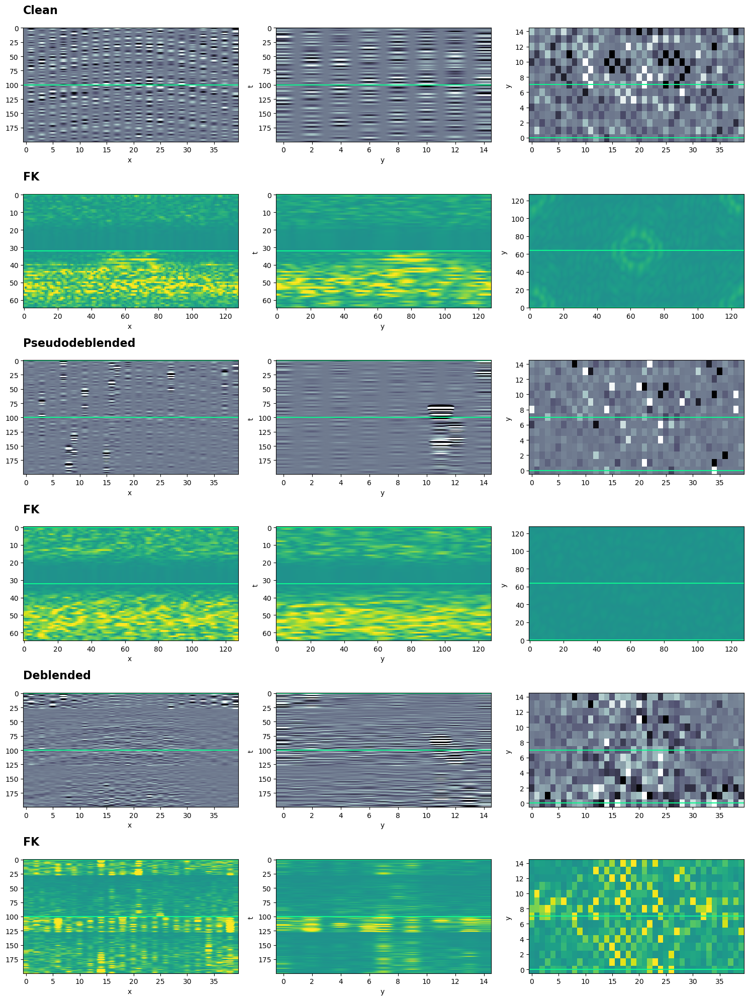

In [92]:
plot_volumes([clean_patch,clean_fk,pseudo_patch,pseudo_fk,deblended_patch,deblended_fk],6,['Clean','FK','Pseudodeblended','FK','Deblended','FK'])